
# Vehicles US

# Contents <a id='back'></a>

* [Introduction](#intro)
* [Stage 1. Data overview](#data_review)
    * [Conclusions](#data_review_conclusions)
* [Stage 2. Data preprocessing](#data_preprocessing)
    * [Conclusions](#data_preprocessing_conclusions)
* [Stage 3. Data analyzing](#hypotheses)
    * [Histogram 1: Best selling models](#activity)
    * [Histogram 2: Car prices by condition](#act1)
    * [Plot 1: Price by mileage and condition](#act2)
    * [Plot 2: Price by year make and condition](#act3)
* [Findings](#end)

## Introduction <a id='intro'></a>


This project is to analyze the data stored in `'vehicles_us.csv'`; to determine correlation between price and age, mileage, and condition of  the vehicle; to determine which models are the  most on market; to create python virtual environments, to develope a web application, and deploy it to a cloud service that will make it accessible to the public.

### Stages 
 
This project consists of three stages:
 1. Data overview
 2. Data preprocessing
 3. Analyzing data
 
[Back to Contents](#back)

## Stage 1. Data overview <a id='data_review'></a>

Open the data and explore it.

In [28]:
# importing pandas, numpy and plotly.express libraries
import pandas as pd
import numpy as np
import plotly.express as px

In [29]:
# Load dataset
df = pd.read_csv("/Users/kseniyagormash/Project_6/vehicles_us.csv")

In [30]:
# obtaining the first 10 rows from the df table
df.head(10)

,price,model_year,model,condition,cylinders,fuel,odometer,transmission,type,paint_color,is_4wd,date_posted,days_listed
0,9400,2011.0,bmw x5,good,6.0,gas,145000.0,automatic,SUV,NaN,1.0,2018-06-23,19
1,25500,NaN,ford f-150,good,6.0,gas,88705.0,automatic,pickup,white,1.0,2018-10-19,50
2,5500,2013.0,hyundai sonata,like new,4.0,gas,110000.0,automatic,sedan,red,NaN,2019-02-07,79
3,1500,2003.0,ford f-150,fair,8.0,gas,NaN,automatic,pickup,NaN,NaN,2019-03-22,9
4,14900,2017.0,chrysler 200,excellent,4.0,gas,80903.0,automatic,sedan,black,NaN,2019-04-02,28
5,14990,2014.0,chrysler 300,excellent,6.0,gas,57954.0,automatic,sedan,black,1.0,2018-06-20,15
6,12990,2015.0,toyota camry,excellent,4.0,gas,79212.0,automatic,sedan,white,NaN,2018-12-27,73
7,15990,2013.0,honda pilot,excellent,6.0,gas,109473.0,automatic,SUV,black,1.0,2019-01-07,68
8,11500,2012.0,kia sorento,excellent,4.0,gas,104174.0,automatic,SUV,NaN,1.0,2018-07-16,19
9,9200,2008.0,honda pilot,excellent,NaN,gas,147191.0,automatic,SUV,blue,1.0,2019-02-15,17


In [31]:
# obtaining general information about the data in df
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51525 entries, 0 to 51524
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   price         51525 non-null  int64  
 1   model_year    47906 non-null  float64
 2   model         51525 non-null  object 
 3   condition     51525 non-null  object 
 4   cylinders     46265 non-null  float64
 5   fuel          51525 non-null  object 
 6   odometer      43633 non-null  float64
 7   transmission  51525 non-null  object 
 8   type          51525 non-null  object 
 9   paint_color   42258 non-null  object 
 10  is_4wd        25572 non-null  float64
 11  date_posted   51525 non-null  object 
 12  days_listed   51525 non-null  int64  
dtypes: float64(4), int64(2), object(7)
memory usage: 5.1+ MB


### Conclusions <a id='data_review_conclusions'></a> 

Each row in the table stores data on a vehicle that was listed for sale. Most columns describe the vehicle itself. 

It's clear that the data is sufficient to alalyze. However, there are missing values.

To move forward, we need to preprocess the data.

[Back to Contents](#back)

## Stage 2. Data preprocessing <a id='data_preprocessing'></a>

In [5]:
# the list of column names in the df table
df.columns

Index(['price', 'model_year', 'model', 'condition', 'cylinders', 'fuel',
       'odometer', 'transmission', 'type', 'paint_color', 'is_4wd',
       'date_posted', 'days_listed'],
      dtype='object')

The table contains 13 columns: `'price'`, `'model_year'`, `'model'`, `'condition'`, `'cylinders'`, `'fuel'`, `'odometer'`, `'transmission'`, `'type'`, `'paint_color'`, `'is_4wd'`, `'date_posted'`, `'days_listed'`. 
They store float64(4), int64(2), object(7) data types.

We don't see any issues with style in the column names, but let's change `'model_year'` to `'year'`.

The number of column values is different. This means the data contains missing values.


In [6]:
# renaming column
df = df.rename(
  columns = {'model_year':'year'    
  }
)

In [7]:
# the list of column names in the df table to check if name changed
df.columns

Index(['price', 'year', 'model', 'condition', 'cylinders', 'fuel', 'odometer',
       'transmission', 'type', 'paint_color', 'is_4wd', 'date_posted',
       'days_listed'],
      dtype='object')

In [8]:
# calculating missing values 
print(df.isna().sum()) 

price               0
year             3619
model               0
condition           0
cylinders        5260
fuel                0
odometer         7892
transmission        0
type                0
paint_color      9267
is_4wd          25953
date_posted         0
days_listed         0
dtype: int64


We can see missing values in `'year'`, `'cylinders'`, `'odometer'`, `'paint_color'`, `'is_4wd'`. 
Let's replace them with `'unknown'` and 0 for `'is_4wd'`.

In [9]:
# replacing missing values in 'paint_color' with 'unknown'
df['paint_color'] = df['paint_color'].fillna('unknown')

# to check 
df.head(10)

,price,year,model,condition,cylinders,fuel,odometer,transmission,type,paint_color,is_4wd,date_posted,days_listed
0,9400,2011.0,bmw x5,good,6.0,gas,145000.0,automatic,SUV,unknown,1.0,2018-06-23,19
1,25500,NaN,ford f-150,good,6.0,gas,88705.0,automatic,pickup,white,1.0,2018-10-19,50
2,5500,2013.0,hyundai sonata,like new,4.0,gas,110000.0,automatic,sedan,red,NaN,2019-02-07,79
3,1500,2003.0,ford f-150,fair,8.0,gas,NaN,automatic,pickup,unknown,NaN,2019-03-22,9
4,14900,2017.0,chrysler 200,excellent,4.0,gas,80903.0,automatic,sedan,black,NaN,2019-04-02,28
5,14990,2014.0,chrysler 300,excellent,6.0,gas,57954.0,automatic,sedan,black,1.0,2018-06-20,15
6,12990,2015.0,toyota camry,excellent,4.0,gas,79212.0,automatic,sedan,white,NaN,2018-12-27,73
7,15990,2013.0,honda pilot,excellent,6.0,gas,109473.0,automatic,SUV,black,1.0,2019-01-07,68
8,11500,2012.0,kia sorento,excellent,4.0,gas,104174.0,automatic,SUV,unknown,1.0,2018-07-16,19
9,9200,2008.0,honda pilot,excellent,NaN,gas,147191.0,automatic,SUV,blue,1.0,2019-02-15,17


In [10]:
# replacing missing values in is_4wd: 1 indicates 4wd, 0 - not 4wd
df['is_4wd'] = df['is_4wd'].fillna(0).astype(float).astype(int)

# to check 
#df.head(10)

In [11]:
# looping over columns 'cylinders','year', and 'odometer' and replacing missing values whith the median
#for the certain vehicle model.  
# there is some missing values in 'odometer' column since none of the odometers are known for some models
columns_to_replace = ['cylinders', 'year', 'odometer'] # list of columns with missing values
for column in columns_to_replace:
    df[column] = df.groupby('model')[column].transform(lambda x: x.fillna(x.median())) 

# dropping missing values (they are only in 'odometer' column)
df = df.dropna()
# change data type to integer
df[columns_to_replace] = df[columns_to_replace].astype(float).astype(int)

# to check 
#df.head(10)

In [12]:
# checking for missing values again
print(df.isna().sum())

price           0
year            0
model           0
condition       0
cylinders       0
fuel            0
odometer        0
transmission    0
type            0
paint_color     0
is_4wd          0
date_posted     0
days_listed     0
dtype: int64


In [13]:
# counting clear duplicates
print(df.duplicated().sum())

0


There are no duplicates.

In [14]:
# viewing unique model names to check for implicit duplicates
print(df['model'].sort_values().unique())

['acura tl' 'bmw x5' 'buick enclave' 'cadillac escalade'
 'chevrolet camaro' 'chevrolet camaro lt coupe 2d' 'chevrolet colorado'
 'chevrolet corvette' 'chevrolet cruze' 'chevrolet equinox'
 'chevrolet impala' 'chevrolet malibu' 'chevrolet silverado'
 'chevrolet silverado 1500' 'chevrolet silverado 1500 crew'
 'chevrolet silverado 2500hd' 'chevrolet silverado 3500hd'
 'chevrolet suburban' 'chevrolet tahoe' 'chevrolet trailblazer'
 'chevrolet traverse' 'chrysler 200' 'chrysler 300'
 'chrysler town & country' 'dodge charger' 'dodge dakota'
 'dodge grand caravan' 'ford econoline' 'ford edge' 'ford escape'
 'ford expedition' 'ford explorer' 'ford f-150' 'ford f-250'
 'ford f-250 sd' 'ford f-250 super duty' 'ford f-350 sd' 'ford f150'
 'ford f150 supercrew cab xlt' 'ford f250' 'ford f250 super duty'
 'ford f350' 'ford f350 super duty' 'ford focus' 'ford focus se'
 'ford fusion' 'ford fusion se' 'ford mustang' 'ford mustang gt coupe 2d'
 'ford ranger' 'ford taurus' 'gmc acadia' 'gmc sierra' '


We can see the following implicit duplicates:
* `'f150'`, `'f-150'`,
* `'f250'`, `'f-250'`,
* `'f250 super duty'`, `'f-250 super duty'`,
* `'f350'`, `'f-350'`,
* `'f150 supercrew cab xlt'`, `'f-150 supercrew cab xlt'`,
* `'ford f350 sd'`, `'ford f350 super duty'`.

Let's get rid of them.


In [15]:
# function for replacing implicit duplicates
def replace_wrong_models(wrong_models, correct_model): # passing a list of wrong models and a string with the correct model on the function's input
    for wrong_model in wrong_models: # looping over misspelled names
        df['model'] = df['model'].replace(wrong_models, correct_model) # replacing wrong models

In [16]:
# removing implicit duplicates
# [wrong model, correct model]
duplicates = [
    ['ford f150', 'ford f-150'],
    ['ford f250', 'ford f-250'],
    [['ford f250 super duty', 'ford f-250 super duty'], 'ford f-250 sd'],
    ['ford f350', 'ford f-350'],
    ['ford f150 supercrew cab xlt', 'ford f-150 supercrew cab xlt'],
    [['ford f350 sd', 'ford f350 super duty'], 'ford f-350 sd']
]

for d in duplicates:
    replace_wrong_models(d[0], d[1])

In [17]:
# checking for implicit duplicates again
print(df['model'].sort_values().unique())

['acura tl' 'bmw x5' 'buick enclave' 'cadillac escalade'
 'chevrolet camaro' 'chevrolet camaro lt coupe 2d' 'chevrolet colorado'
 'chevrolet corvette' 'chevrolet cruze' 'chevrolet equinox'
 'chevrolet impala' 'chevrolet malibu' 'chevrolet silverado'
 'chevrolet silverado 1500' 'chevrolet silverado 1500 crew'
 'chevrolet silverado 2500hd' 'chevrolet silverado 3500hd'
 'chevrolet suburban' 'chevrolet tahoe' 'chevrolet trailblazer'
 'chevrolet traverse' 'chrysler 200' 'chrysler 300'
 'chrysler town & country' 'dodge charger' 'dodge dakota'
 'dodge grand caravan' 'ford econoline' 'ford edge' 'ford escape'
 'ford expedition' 'ford explorer' 'ford f-150'
 'ford f-150 supercrew cab xlt' 'ford f-250' 'ford f-250 sd' 'ford f-350'
 'ford f-350 sd' 'ford focus' 'ford focus se' 'ford fusion'
 'ford fusion se' 'ford mustang' 'ford mustang gt coupe 2d' 'ford ranger'
 'ford taurus' 'gmc acadia' 'gmc sierra' 'gmc sierra 1500'
 'gmc sierra 2500hd' 'gmc yukon' 'honda accord' 'honda civic'
 'honda civic 

In [18]:
# saving new table
#df.to_csv('/Users/kseniyagormash/Project_6/processed_vehicles_us.csv', index=False)


### Conclusions <a id='data_preprocessing_conclusions'></a>
We detected three issues with the data:

- Missing values
- Implicit duplicates

All missing values have been replaced with `'unknown'`, 0 or median. But there is some missing values in 'odometer' column, since none of the odometers are known for some models. And, we still have to see whether the missing values will affect our calculations.

The absence of duplicates will make the results more precise and easier to understand.

[Back to Contents](#back)

## Stage 3. Analyzing data <a id='hypotheses'></a>

### Histogram 1: Most selling models <a id='activity'></a>

In [19]:
# counting models and sorting the result in descending order
model_counts = df.groupby('model')['model'].count().sort_values(ascending=False)
model_counts.head(10)

model
ford f-150                    3326
chevrolet silverado 1500      2171
ram 1500                      1750
chevrolet silverado           1271
jeep wrangler                 1119
ram 2500                      1091
ford f-250 sd                 1037
toyota camry                   990
honda accord                   964
chevrolet silverado 2500hd     915
Name: model, dtype: int64

In [20]:
# Create a histogram to know what models are for sale most.
# Set the axis labels
# Show the plot
fig = px.histogram(x=model_counts.index, y=model_counts.values, title='Most selling models')
fig.update_layout(xaxis_title='Car Model', yaxis_title='Number of listings')
fig.show()

Top 10 models on sale: 
1. ford f-150                    
2. chevrolet silverado 1500      
3. ram 1500                     
4. chevrolet silverado           
5. jeep wrangler                 
6. ram 2500                      
7. ford f-250 sd                 
8. toyota camry                   
9. honda accord 
10. chevrolet silverado 2500hd                                         

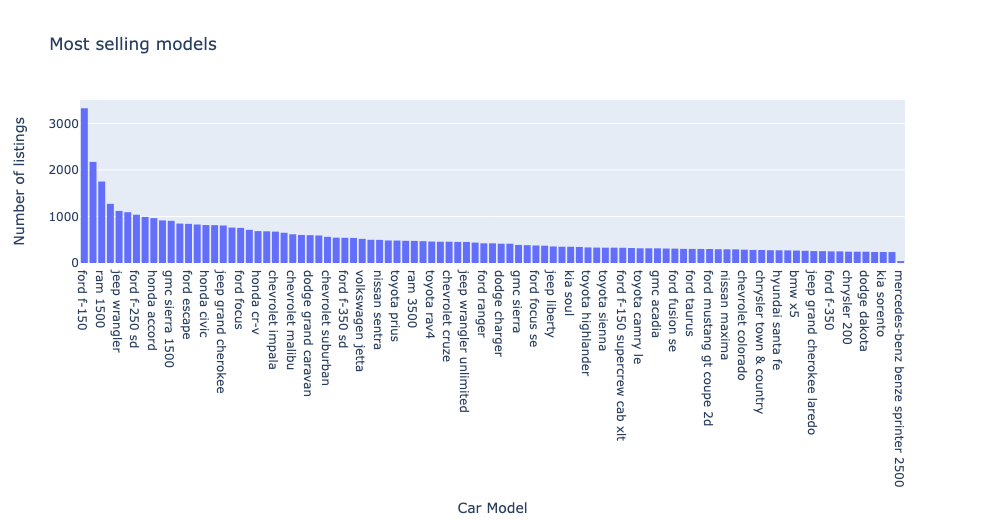

In [32]:
# adding picture of histogram
from IPython import display
display.Image("/Users/kseniyagormash/Project_6/pics/newplot.png")

### Histogram 2: Car prices by condition <a id='act1'></a>

In [22]:
# creating histogram to know how condition affects price
fig1 = px.histogram(
    df, 
    x='price',
    title='Car prices by condition', 
    color='condition', 
     )

# setting the range of the x-axis to be between 0 and 50000 to make visualization more clear
fig1.update_xaxes(range=[0, 50_000])
# Setind the axis labels
fig1.update_layout(xaxis_title='Price', yaxis_title='Number of listings')
# displaing the histogram
fig1.show()

Conclusions:
* most listings with a price of less than $20000.
* most of cars are sold in good or excellent conditions.
* least of cars are sold in new, fair, and solvage conditions.

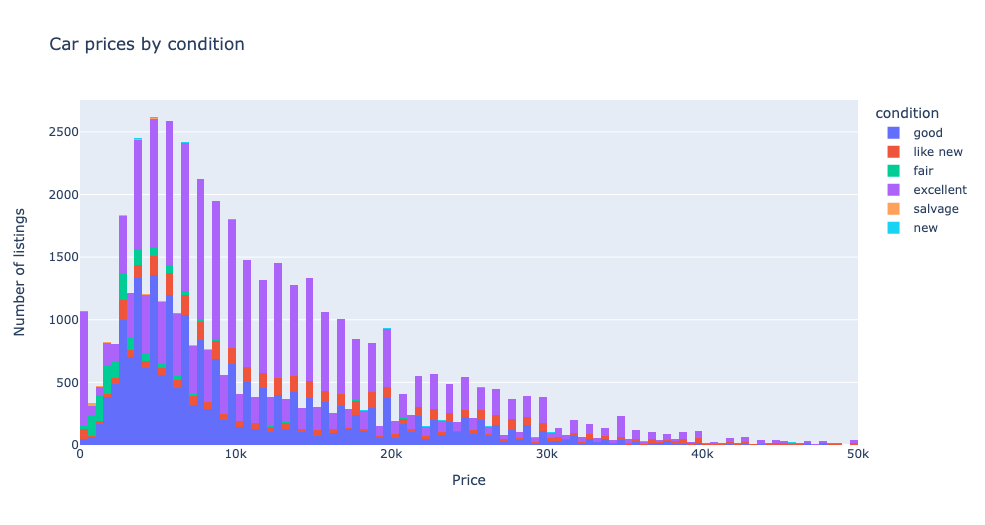

In [23]:
# adding picture of histogram
from IPython import display
display.Image("/Users/kseniyagormash/Project_6/pics/plot.png")

### Plot 1: Price by mileage and condition <a id='act2'></a>

In [24]:
# creating scatter plot to know how mileage affects price
fig2 = px.scatter(
    df, 
    x='odometer', 
    y='price', 
    title='Price by mileage and contition', 
    color='condition'
    )

# setting the range of the x-axis to be between 0 and 600000 
fig2.update_xaxes(range=[0, 600_000])
fig2.update_yaxes(range=[0, 100_000])
# displaing the plot
fig2.show()

Conclusions: 
* positive correlation between condition and price: better condition - higher price
* negative correlation between mileage and price: higher mileage - lower price

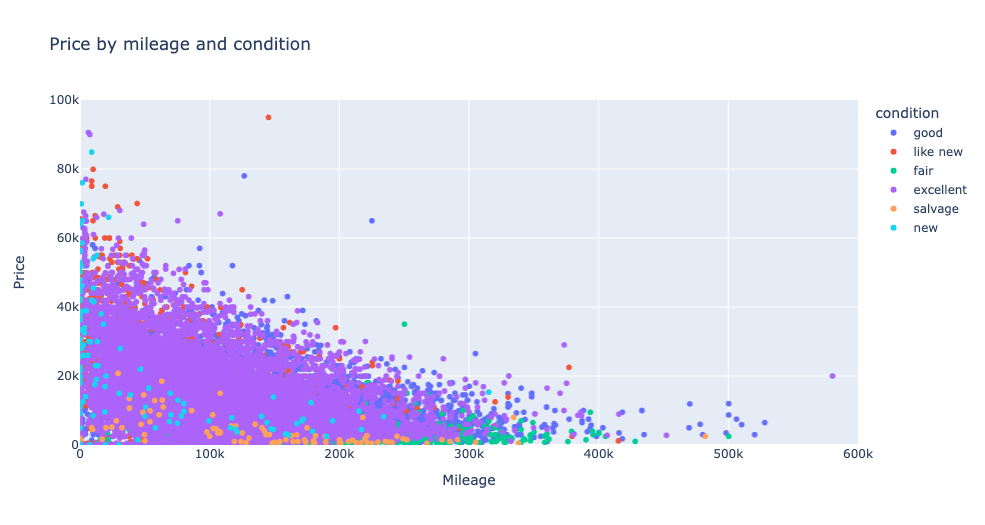

In [25]:
# adding picture of plot
from IPython import display
display.Image("/Users/kseniyagormash/Project_6/pics/newplot1.png")

### Plot 2: Price by make year and condition <a id='act3'></a>

In [26]:
# creating scatter plot to know how age affects price
fig2 = px.scatter(
    df, 
    x='year', 
    y='price', 
    title='Price by make year and contition', 
    color='condition'
    )
# setting the range of the x-axis and y-axis 
fig2.update_xaxes(range=[1900, 2020])
fig2.update_yaxes(range=[0, 100_000])
# displaing the plot
fig2.show()

Conclusions:
* positive correlation between price and age of vehicle.
* vehicles made between 1960 and 1980 in  exellent condition have high price

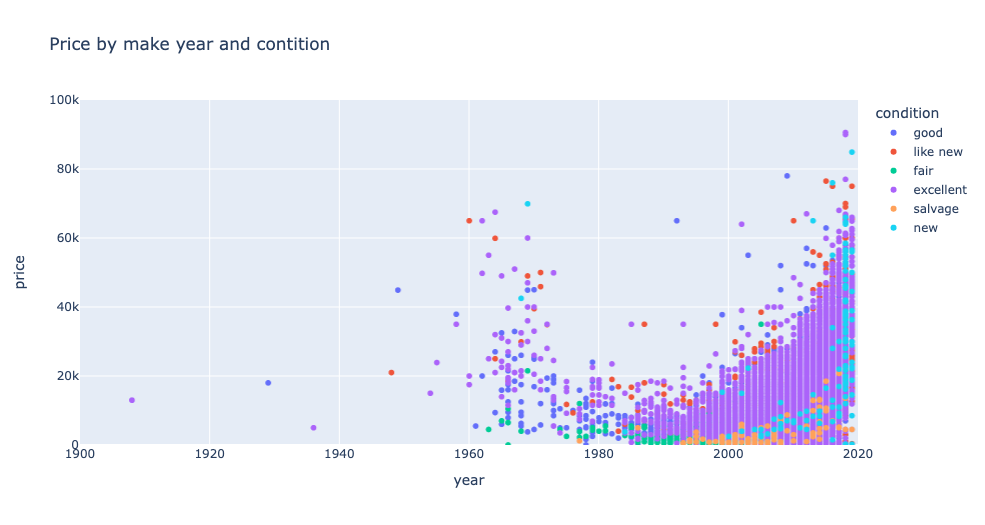

In [27]:
# adding picture of plot
from IPython import display
display.Image("/Users/kseniyagormash/Project_6/pics/newplot2.png")

[Back to Contents](#back)

# Findings <a id='end'></a>

Based on the analysis, here are the key conclusions:

* Price is positively correlated with the condition and age of the vehicle.
* Price is negatively correlated with mileage.
* The majority of listings have prices of less than $20,000.
* Most of the cars are sold in good or excellent conditions.
* There are fewer cars sold in new, fair, and salvage conditions.
* Vehicles made between 1960 and 1980 in excellent condition have a higher price.
* The most selling models are, in order:
           * Ford F-150
           * Chevrolet Silverado 1500
           * Ram 1500
           * Chevrolet Silverado
           * Jeep Wrangler
           * Ram 2500
           * Ford F-250 SD
           * Toyota Camry
           * Honda Accord
           * Chevrolet Silverado 2500HD

[Back to Contents](#back)